# **Human Action Recognition with MMPose and Spatio-Tempoal Graph Network**

# Download the Florence 3D action dataset.

## Florence 3D actions dataset

The dataset collected at the University of Florence during 2012, has been captured using a Kinect camera. It includes 9 activities: wave, drink from a bottle, answer phone,clap, tight lace, sit down, stand up, read watch, bow. During acquisition, 10 subjects were asked to perform the above
actions for 2/3 times. This resulted in a total of 215 activity samples.
We suggest a leave-one-actor-out protocol: train your classifier using all the sequences from 9 out of 10 actors and test on the remaining one. Repeat this procedure for all actors and average the 10 classification accuracy values.

Actions 
1.	wave
2.	drink from a bottle
3.	answer phone
4.	clap
5.	tight lace
6.	sit down
7.	stand up
8.	read watch
9.	bow

Videos depicting the actions are named GestureRecording_Id\<ID_GESTURE\>actor\<ID_ACTOR\>idAction\<ID_ACTION\>category\<ID_CATEGORY\>.avi
The file The file Florence_dataset_Features.txt contains all the pose features with annotate actor and actions. Each line is formatted according to the following:

%idvideo idactor idcategory  f1....fn

where f1-f24 are our normalized body part coordinates
and f25 is the normalized frame value.

Specifically:  
  elbows: f1-f6; (1-3 left elbow, 4-6 right elbow, same applies for all other joints)  
  wrists: f13-f18  
  knees: f7-f12  
  ankles: f19-f24  
  normalized frame value: f25  

The file Florence_dataset_WorldCoordinates.txt
Contains the world coordinates for all the joints. Thanks to Maxime Devanne for parsing this data! Each line is formatted according to the following:

%idvideo idactor idcategory  f1....fn
where f1-f45 are world coordinates of all the 15 joints.

Specifically:  
  Head: f1-f3  
  Neck: f4-f6  
  Spine: f7-f9  
  Left Shoulder: f10-f12  
  Left Elbow: f13-f15  
  Left Wrist: f16-f18  
  Right Shoulder: f19-f21  
  Right Elbow: f22-f24  
  Right Wrist: f25-f27  
  Left Hip: f28-f30  
  Left Knee: f31-f33  
  Left Ankle: f34-f36  
  Right Hip: f37-f39  
  Right Knee: f40-f42  
  Right Ankle: f43-f45  


In [ ]:
%%shell
curl https://www.micc.unifi.it/vim/wp-content/uploads/datasets/florence3d_actions.zip -o florence3d_actions.zip
unzip -o -q florence3d_actions.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  303M  100  303M    0     0  11.1M      0  0:00:27  0:00:27 --:--:-- 7871k


# Functions

In [ ]:
# visualization
def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

# Installation

## Install MMPose

In [ ]:
%%shell
# This installation takes a long time due to the compiation of mmcv-full (about 10 mins)
pip install -q mmdet mmcv-full

git clone https://github.com/open-mmlab/mmpose.git
cd mmpose
pip install -q -r requirements.txt
python setup.py -q develop

     |████████████████████████████████| 471kB 7.5MB/s 
     |████████████████████████████████| 256kB 24.6MB/s 
     |████████████████████████████████| 194kB 16.9MB/s 
Cloning into 'mmpose'...
remote: Enumerating objects: 451, done.
remote: Counting objects: 100% (451/451), done.
remote: Compressing objects: 100% (297/297), done.
remote: Total 4565 (delta 280), reused 274 (delta 151), pack-reused 4114
Receiving objects: 100% (4565/4565), 13.06 MiB | 40.89 MiB/s, done.
Resolving deltas: 100% (2910/2910), done.
     |████████████████████████████████| 51kB 4.6MB/s 
     |████████████████████████████████| 317kB 14.1MB/s 
     |████████████████████████████████| 81kB 9.3MB/s 
     |████████████████████████████████| 51kB 7.5MB/s 
     |████████████████████████████████| 112kB 11.8MB/s 
     |████████████████████████████████| 71kB 7.2MB/s 
     |████████████████████████████████| 51kB 7.6MB/s 
     |████████████████████████████████| 51kB 6.4MB/s 
     |████████████████████████████████| 153kB 15.7

## Install MMSkeleton

In [ ]:
%%shell
git clone https://github.com/open-mmlab/mmskeleton.git
cd mmskeleton
pip install -q -r requirements.txt
python setup.py -q develop

Cloning into 'mmskeleton'...
remote: Enumerating objects: 1, done.
remote: Counting objects: 100% (1/1), done.
remote: Total 3065 (delta 0), reused 0 (delta 0), pack-reused 3064
Receiving objects: 100% (3065/3065), 93.35 MiB | 41.85 MiB/s, done.
Resolving deltas: 100% (1596/1596), done.
     |████████████████████████████████| 256kB 8.4MB/s 
Compiling mmskeleton/ops/nms/cpu_nms.pyx because it changed.
[1/1] Cythonizing mmskeleton/ops/nms/cpu_nms.pyx
/usr/local/lib/python3.6/dist-packages/Cython/Compiler/Main.py:369: FutureWarning: Cython directive 'language_level' not set, using 2 for now (Py2). This will change in a later release! File: /content/mmskeleton/mmskeleton/ops/nms/cpu_nms.pyx
  tree = Parsing.p_module(s, pxd, full_module_name)
/usr/local/lib/python3.6/dist-packages/setuptools/dist.py:452: UserWarning: Normalizing '0.7.rc1+b4c076b' to '0.7rc1+b4c076b'
  warnings.warn(tmpl.format(**locals()))
/usr/local/lib/python3.6/dist-packages/torch/utils/cpp_extension.py:339: UserWarning:

# Test data preparation using youtube

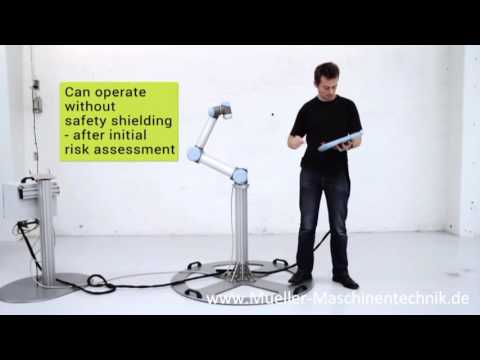

In [ ]:
from IPython.display import Image
from IPython.display import YouTubeVideo
YOUTUBE_ID = '18VJhTsU96w'
YouTubeVideo(YOUTUBE_ID)

In [ ]:
!pip install youtube-dl
!rm -df youtube.mp4
# download the youtube with the given ID
!youtube-dl -f 'bestvideo[ext=mp4]' --output "youtube.%(ext)s" https://www.youtube.com/watch?v=$YOUTUBE_ID
%cd mmpose

     |████████████████████████████████| 1.9MB 9.1MB/s 
[youtube] 18VJhTsU96w: Downloading webpage
[download] Destination: youtube.mp4
[download] 100% of 28.83MiB in 00:01
/content/mmpose


In [ ]:
!ffmpeg -y -loglevel panic -i ../youtube.mp4 -ss 00:01:46 -t 15 demo/demo_video.mp4 # <-- see this
show_local_mp4_video('demo/demo_video.mp4')

# Pose estimation test

In [ ]:
#@title 2D Human Pose Top-Down Image Demo using gt human bounding boxes as input
!python demo/top_down_img_demo.py \
    configs/top_down/hrnet/coco/hrnet_w48_coco_256x192.py \
    https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth \
    --img-root tests/data/coco/ --json-file tests/data/coco/test_coco.json \
    --out-img-root vis_results0


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Downloading: "https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth" to /root/.cache/torch/hub/checkpoints/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth
100% 243M/243M [00:19<00:00, 13.3MB/s]


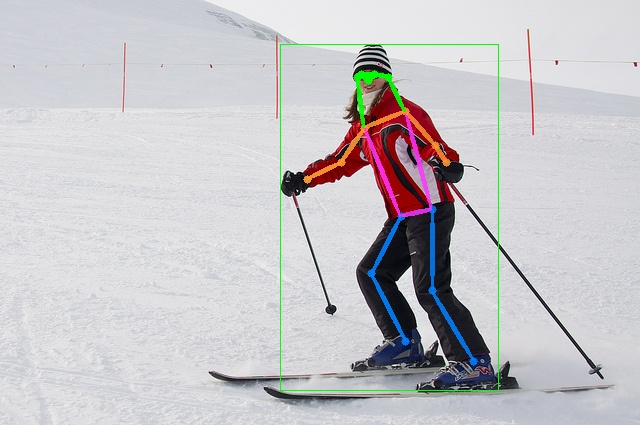

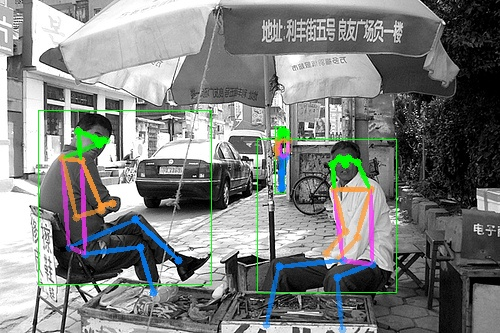

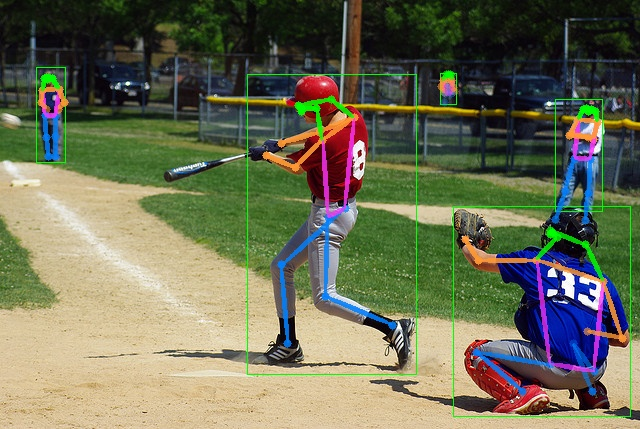

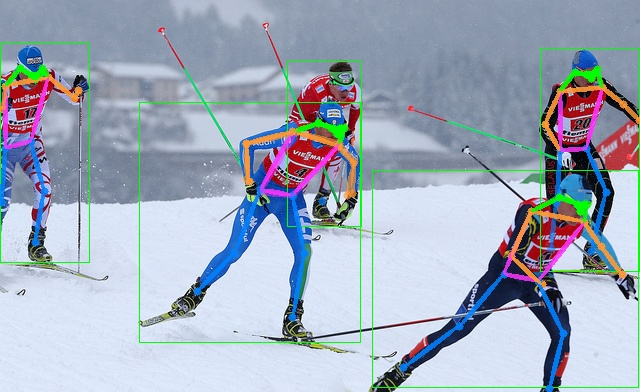

In [ ]:
#@title 
display(Image('vis_results0/vis_0.jpg',width=400), Image('vis_results0/vis_1.jpg',width=400))
display(Image('vis_results0/vis_2.jpg',width=400), Image('vis_results0/vis_3.jpg',width=400))

In [ ]:
#@title 2D Human Pose Top-Down Image Demo using mmdet for human bounding box detection
!python demo/top_down_img_demo_with_mmdet.py \
    demo/mmdetection_cfg/faster_rcnn_r50_fpn_1x_coco.py \
    http://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth \
    configs/top_down/hrnet/coco/hrnet_w48_coco_256x192.py \
    https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth \
    --img-root tests/data/coco/ \
    --img 000000196141.jpg \
    --out-img-root vis_results0

Downloading: "http://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth" to /root/.cache/torch/hub/checkpoints/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth
100% 160M/160M [00:12<00:00, 12.9MB/s]


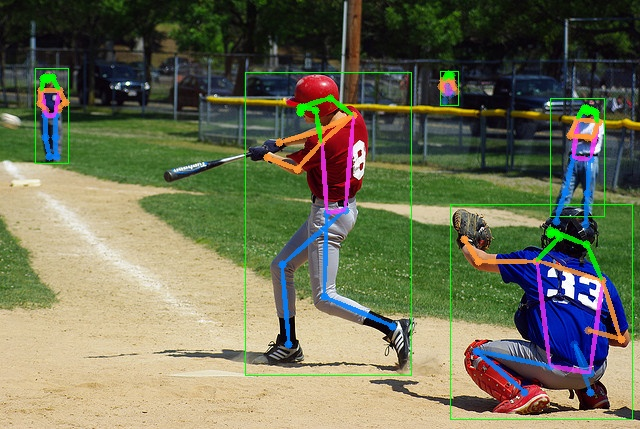

In [ ]:
#@title 
display(Image('vis_results0/vis_000000196141.jpg',width=400))

In [ ]:
#@title 2D Human Pose Top-Down Video Demo
!python demo/top_down_video_demo_with_mmdet.py \
    demo/mmdetection_cfg/faster_rcnn_r50_fpn_1x_coco.py \
    http://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth \
    configs/top_down/hrnet/coco/hrnet_w48_coco_256x192.py \
    https://download.openmmlab.com/mmpose/top_down/hrnet/hrnet_w48_coco_256x192-b9e0b3ab_20200708.pth \
    --video-path demo/demo_video.mp4 \
    --out-video-root vis_results0
!ffmpeg -y -loglevel panic -i vis_results0/vis_demo_video.mp4 -vcodec libx264 vis_results0/vis_demo_video_.mp4
show_local_mp4_video('vis_results0/vis_demo_video_.mp4')

In [ ]:
#@title 2D Human Pose Bottom-Up Image Demo
!python demo/bottom_up_img_demo.py \
    configs/bottom_up/hrnet/coco/hrnet_w32_coco_512x512.py \
    https://download.openmmlab.com/mmpose/bottom_up/hrnet_w32_coco_512x512-bcb8c247_20200816.pth \
    --img-root tests/data/coco/ --json-file tests/data/coco/test_coco.json \
    --out-img-root vis_results

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Downloading: "https://download.openmmlab.com/mmpose/bottom_up/hrnet_w32_coco_512x512-bcb8c247_20200816.pth" to /root/.cache/torch/hub/checkpoints/hrnet_w32_coco_512x512-bcb8c247_20200816.pth
100% 109M/109M [00:09<00:00, 11.9MB/s]


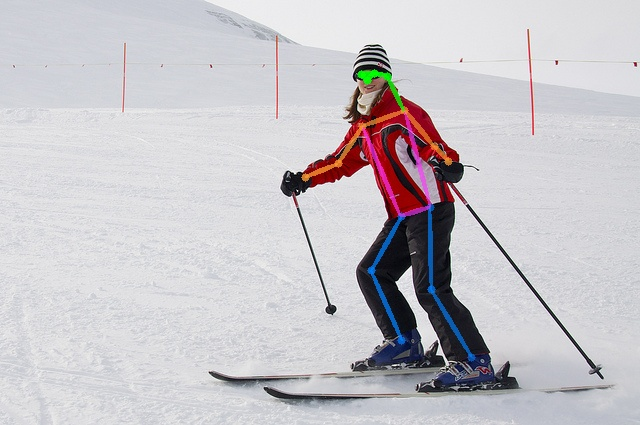

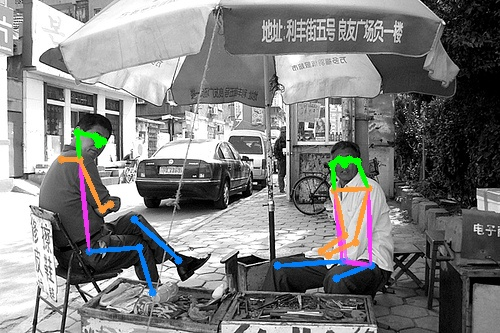

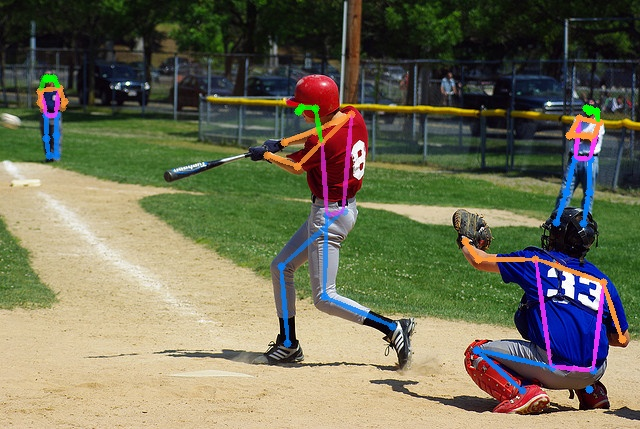

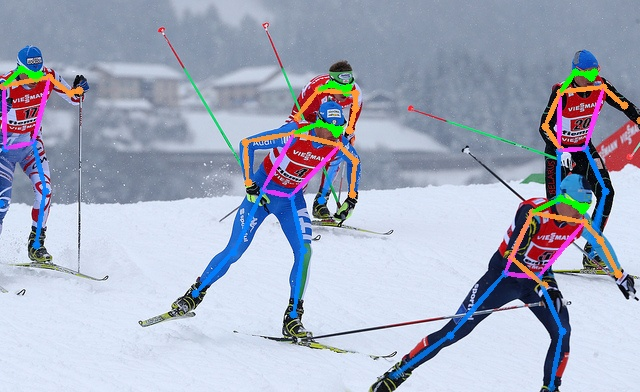

In [ ]:
#@title 
display(Image('/content/mmpose/vis_results/vis_0.jpg',width=400), Image('/content/mmpose/vis_results/vis_1.jpg',width=400))
display(Image('/content/mmpose/vis_results/vis_2.jpg',width=400), Image('/content/mmpose/vis_results/vis_3.jpg',width=400))

In [ ]:
#@title 2D Human Pose Bottom-Up Video Demo
!python demo/bottom_up_video_demo.py \
    configs/bottom_up/hrnet/coco/hrnet_w32_coco_512x512.py \
    https://download.openmmlab.com/mmpose/bottom_up/hrnet_w32_coco_512x512-bcb8c247_20200816.pth \
    --video-path demo/demo_video.mp4 \
    --out-video-root vis_results

In [ ]:
#@title 
!ffmpeg -y -loglevel panic -i vis_results/vis_demo_video.mp4 -vcodec libx264 vis_results/vis_demo_video_.mp4
show_local_mp4_video('vis_results/vis_demo_video_.mp4')

In [ ]:
#@title video for hand skeletion detection
!ffmpeg -y -loglevel panic -i ../youtube.mp4 -ss 00:01:35 -t 10 demo/demo_video1.mp4 # <-- see this
show_local_mp4_video('demo/demo_video1.mp4')

In [ ]:
#@title 2D hand keypoint demo using gt hand bounding boxes as input
!python demo/top_down_img_demo.py \
    configs/hand/resnet/onehand10k/res50_onehand10k_256x256.py \
    https://download.openmmlab.com/mmpose/top_down/resnet/res50_onehand10k_256x256-e67998f6_20200813.pth \
    --img-root tests/data/onehand10k/ --json-file tests/data/onehand10k/test_onehand10k.json \
    --out-img-root vis_results1

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Downloading: "https://download.openmmlab.com/mmpose/top_down/resnet/res50_onehand10k_256x256-e67998f6_20200813.pth" to /root/.cache/torch/hub/checkpoints/res50_onehand10k_256x256-e67998f6_20200813.pth
100% 130M/130M [00:11<00:00, 11.7MB/s]


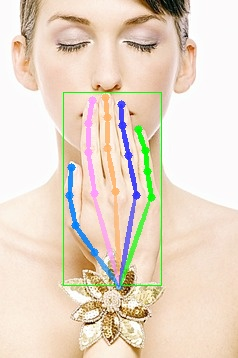

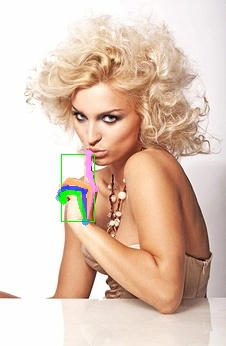

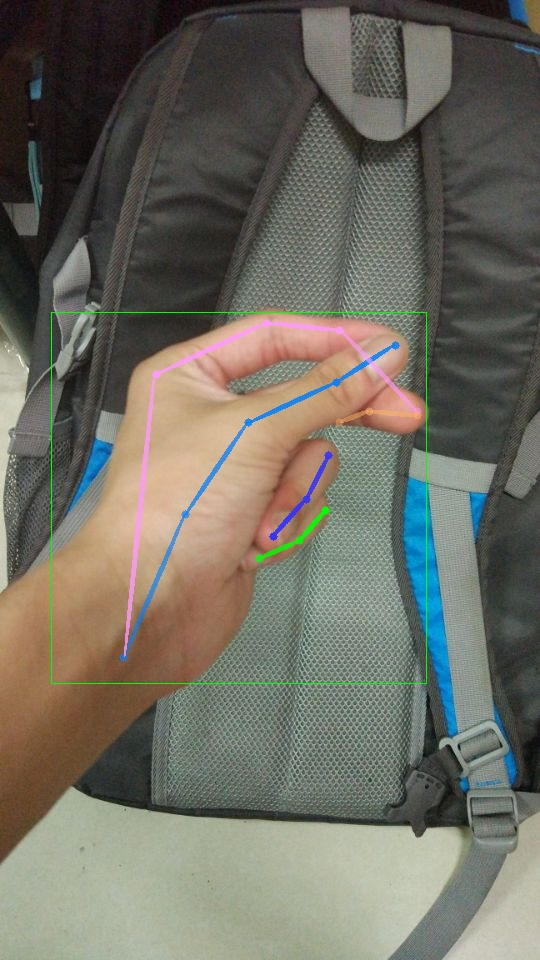

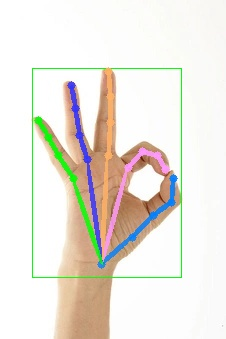

In [ ]:
#@title 
display(Image('/content/mmpose/vis_results1/vis_0.jpg',width=400), Image('/content/mmpose/vis_results1/vis_1.jpg',width=400)) 
display(Image('/content/mmpose/vis_results1/vis_2.jpg',width=400), Image('/content/mmpose/vis_results1/vis_3.jpg',width=400))

In [ ]:
#@title 2D hand keypoint demo using mmdet for hand bounding box detection
!python demo/top_down_img_demo_with_mmdet.py demo/mmdetection_cfg/cascade_rcnn_x101_64x4d_fpn_20e_onehand10k.py \
    https://download.openmmlab.com/mmpose/mmdet_pretrained/cascade_rcnn_x101_64x4d_fpn_20e_onehand10k-dac19597_20201030.pth \
    configs/hand/resnet/onehand10k/res50_onehand10k_256x256.py \
    https://download.openmmlab.com/mmpose/top_down/resnet/res50_onehand10k_256x256-e67998f6_20200813.pth \
    --img-root tests/data/onehand10k/ \
    --img 9.jpg \
    --out-img-root vis_results2

Downloading: "https://download.openmmlab.com/mmpose/mmdet_pretrained/cascade_rcnn_x101_64x4d_fpn_20e_onehand10k-dac19597_20201030.pth" to /root/.cache/torch/hub/checkpoints/cascade_rcnn_x101_64x4d_fpn_20e_onehand10k-dac19597_20201030.pth
100% 486M/486M [00:38<00:00, 13.2MB/s]


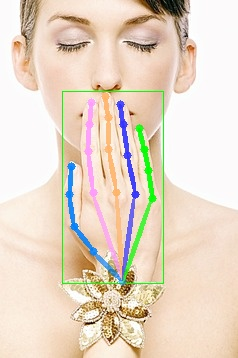

In [ ]:
#@title 
display(Image('vis_results2/vis_9.jpg',width=400))

In [ ]:
#@title 2D Hand Video Demo
!python demo/top_down_video_demo_with_mmdet.py demo/mmdetection_cfg/cascade_rcnn_x101_64x4d_fpn_20e_onehand10k.py \
    https://download.openmmlab.com/mmpose/mmdet_pretrained/cascade_rcnn_x101_64x4d_fpn_20e_onehand10k-dac19597_20201030.pth \
    configs/hand/resnet/onehand10k/res50_onehand10k_256x256.py \
    https://download.openmmlab.com/mmpose/top_down/resnet/res50_onehand10k_256x256-e67998f6_20200813.pth \
    --video-path demo/demo_video1.mp4 \
    --out-video-root vis_results3

In [ ]:
#@title 
!ffmpeg -y -loglevel panic -i vis_results3/vis_demo_video1.mp4 -vcodec libx264 vis_results3/vis_demo_video1_.mp4
show_local_mp4_video('vis_results3/vis_demo_video1_.mp4')

In [ ]:
# Change current working directory to /content
%cd /content

/content


# Action Recognition


In [ ]:
%%shell
git clone https://github.com/taznux/st-gcn-pytorch
cd st-gcn-pytorch
mkdir dataset models
ln -sf /content/Florence_3d_actions dataset/

Cloning into 'st-gcn-pytorch'...
remote: Enumerating objects: 35, done.
remote: Total 35 (delta 0), reused 0 (delta 0), pack-reused 35
Unpacking objects: 100% (35/35), done.


## Original Florence 3D skeletion data

In [ ]:
%cd st-gcn-pytorch
!python preprocess.py # skeleton conversion
!python main.py # train and test

/content/st-gcn-pytorch
GGCN(
  (gcl): GraphConvolution(
    (dropout): Dropout(p=0.0, inplace=False)
  )
  (conv): StandConvolution(
    (dropout): Dropout(p=0.0, inplace=False)
    (conv): Sequential(
      (0): Conv2d(9, 16, kernel_size=(5, 5), stride=(2, 2))
      (1): InstanceNorm2d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (2): ReLU(inplace=True)
      (3): Conv2d(16, 32, kernel_size=(5, 5), stride=(2, 2))
      (4): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (5): ReLU(inplace=True)
      (6): Conv2d(32, 64, kernel_size=(5, 5), stride=(2, 2))
      (7): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (8): ReLU(inplace=True)
    )
    (fc): Linear(in_features=192, out_features=9, bias=True)
  )
)
The number of parameters: 69514
/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:136: UserWarning: Detected call of `lr_scheduler.step()` before `

## mmskeleton


In [ ]:
# %%shell
# cd mmskeleton

# # TODO: need model configuration change
# python mmskl.py pose_demo
# python mmskl.py pose_demo_3D